In [4]:
from typing import cast
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import math
import torch as th
import torch.nn.functional as F
from torch.utils.data import ConcatDataset
from tqdm.notebook import tqdm

from splat_init.data.stanford_2d_3d import Stanford2D3DDataset
from splat_init.data.datamodule_360 import DataModule360, SceneSample

  0%|          | 0/7 [00:00<?, ?it/s]

Num samples: 272
Min / Max: 1 / 64
Mean ± Std: 5.19 ± 6.31
Percentiles (5,25,50,75,95): [ 2  2  3  6 14]


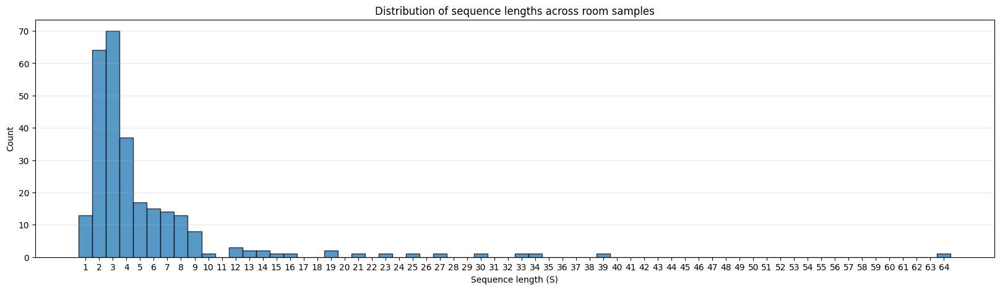

In [ ]:
areas = ("area_1", "area_2", "area_5a", "area_5b", "area_3", "area_4", "area_6")

# Build a concatenated dataset spanning all areas.
base_dir = Path("/home/saps/synced/datasets/360-degree/stanford-2d-3d/no_xyz")
per_area_datasets: list[Stanford2D3DDataset] = []
for a in areas:
    p = base_dir / a
    ds = Stanford2D3DDataset(p)
    per_area_datasets.append(ds)


# Collect sequence lengths (number of spherical/cube frames per room sample)
seq_lengths: list[int] = []
for ds in tqdm(per_area_datasets):
    seq_lengths.extend(map(len, ds._room_indices))

seq_lengths_arr = np.asarray(seq_lengths, dtype=np.int32)

print(f"Num samples: {len(seq_lengths_arr)}")
print(f"Min / Max: {seq_lengths_arr.min()} / {seq_lengths_arr.max()}")
print(f"Mean ± Std: {seq_lengths_arr.mean():.2f} ± {seq_lengths_arr.std():.2f}")
print("Percentiles (5,25,50,75,95):", np.percentile(seq_lengths_arr, [5,25,50,75,95]).astype(int))

# Discrete histogram
min_v, max_v = seq_lengths_arr.min(), seq_lengths_arr.max()
bins = np.arange(min_v, max_v + 2) - 0.5  # center bins on integers

plt.figure(figsize=(20,5))
plt.hist(seq_lengths_arr, bins=bins, edgecolor="black", alpha=0.75)
plt.xticks(np.arange(min_v, max_v + 1))
plt.xlabel("Sequence length (S)")
plt.ylabel("Count")
plt.title("Distribution of sequence lengths across room samples")
plt.grid(axis="y", alpha=0.3)
plt.show()

In [2]:
area_path: Path = Path("/home/saps/synced/datasets/360-degree/stanford-2d-3d/no_xyz/area_1")
dataset = Stanford2D3DDataset(area_path)

In [3]:
room_idx: int = 1
room_sample = dataset[room_idx]
print("ID:", room_sample.id)

ID: stanford-2d-3d/area-1/conference-room-1


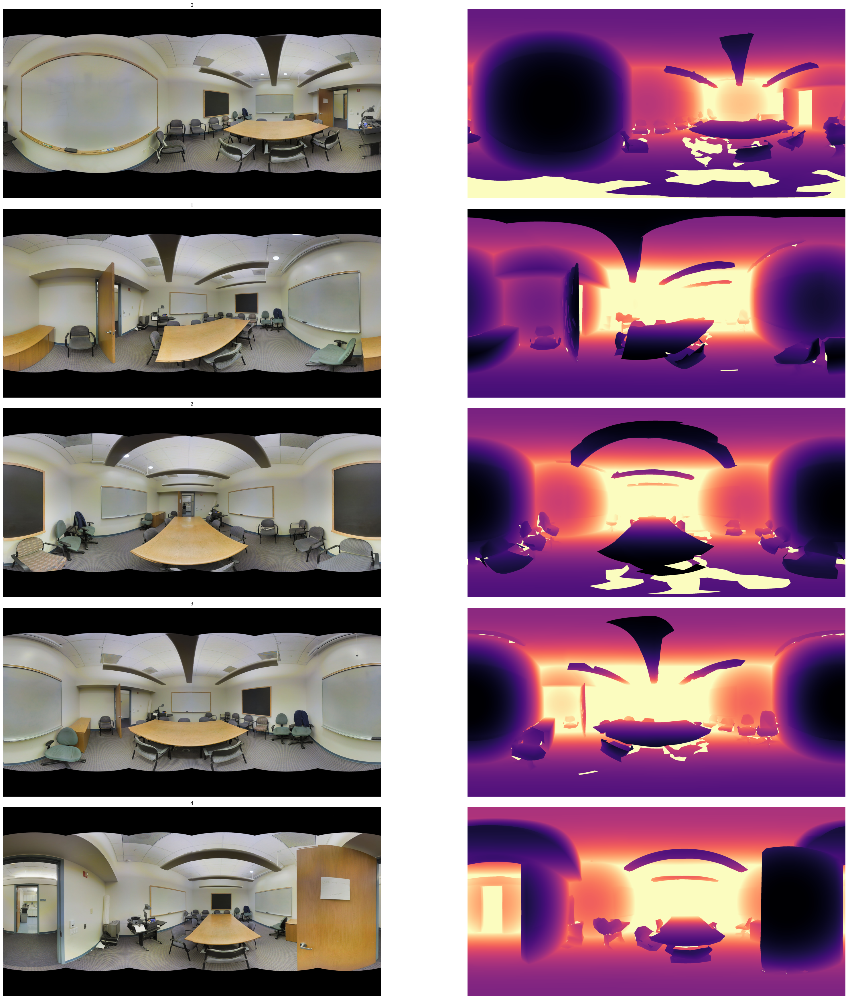

In [10]:
rgb = room_sample.rgba  # [S, 4, H, W], float32
depth = room_sample.depth  # [S, 1, H, W], float32

S = int(rgb.shape[0])
H = int(rgb.shape[2])
W = int(rgb.shape[3])


fig, axes = plt.subplots(S, 2, figsize=(36, 7*S), squeeze=False)

for s in range(S):
    # RGBA for display (scale to [0,1])
    rgba = (rgb[s].permute(1, 2, 0).numpy())
    axes[s, 0].imshow(rgba)
    axes[s, 0].set_title(f"{s}")
    axes[s, 0].axis("off")

    d = depth[s, 0].numpy()
    alpha = rgba[..., 3]
    valid = (d > 0) & (alpha > 0)
    vmin, vmax = np.percentile(d[valid], [1, 90])
    axes[s, 1].imshow(d, cmap="magma", vmin=vmin, vmax=vmax)
    axes[s, 1].axis("off")

plt.tight_layout()
plt.show()



In [39]:
_FACE_ORDER = ["+X","-X","+Y","-Y","+Z","-Z"]

def _dir_for_face(U, V, face):
    one = th.ones_like(U)
    if   face == "+X": X, Y, Z =  one, -V, -U
    elif face == "-X": X, Y, Z = -one, -V,  U
    elif face == "+Y": X, Y, Z =   U,  one,  V
    elif face == "-Y": X, Y, Z =   U, -one, -V
    elif face == "+Z": X, Y, Z =   U, -V,  one
    elif face == "-Z": X, Y, Z =  -U, -V, -one
    D = th.stack([X, Y, Z], dim=0)
    return D / th.linalg.norm(D, dim=0, keepdim=True).clamp_min(1e-12)


def _dirs_to_lonlat(D):          # D: 6x3xF xF
    X, Y, Z = D[:,0], D[:,1], D[:,2]
    lon = th.atan2(X, Z)                          # [-pi, pi]
    lat = th.atan2(Y, th.sqrt(X*X + Z*Z))      # [-pi/2, pi/2]
    return lon, lat

def _wrap_norm(x):               # wrap to [-1,1) for periodic sampling
    return x - 2.0 * th.floor((x + 1.0) / 2.0)

class OTCProjectorWithAlphaGS:
    """
    ERP -> OTC faces in memory.
    - RGB via bilinear grid_sample
    - Alpha via nearest or bilinear
    Returns (faces_rgb, faces_a) with shapes [B,6,3,F,F] and [B,6,1,F,F].
    """
    def __init__(self, face_size, alpha=0.8687, device="cpu", dtype=th.float32):
        self.F = int(face_size)
        self.alpha = float(alpha)
        self.device = th.device(device)
        self.dtype = dtype

        # Precompute OTC face sampling grid in normalized coords for grid_sample.
        g = th.linspace(-1, 1, self.F, device=self.device, dtype=self.dtype)
        v_lin, u_lin = th.meshgrid(g, g, indexing="ij")        # each F x F
        ta = math.tan(self.alpha)
        Upre = th.tan(self.alpha * u_lin) / ta                 # inverse OTC warp
        Vpre = th.tan(self.alpha * v_lin) / ta

        D = th.stack([_dir_for_face(Upre, Vpre, f) for f in _FACE_ORDER], dim=0)  # 6x3xF xF
        lon, lat = _dirs_to_lonlat(D)                              # 6xF xF

        # Normalize for grid_sample (align_corners=True):
        # x in [-1,1] left..right, y in [-1,1] top..bottom
        x = lon / math.pi                                          # [-1,1]
        y = -2.0 * lat / math.pi                                   # [-1,1]
        x = _wrap_norm(x)                                          # periodic in x

        grid = th.stack([x, y], dim=-1)                         # 6xF xF x2
        self.registered_grid = grid.contiguous()                   # keep on device

    @th.no_grad()
    def __call__(self, erp_rgba, alpha_mode="nearest", alpha_index=-1):
        """
        erp_rgba: [B,C,H,W] float on self.device; C must be >= 4
        alpha_mode: 'nearest' or 'bilinear'
        alpha_index: index of alpha channel; negative ok (e.g. -1)
        """
        assert erp_rgba.device == self.device
        if not erp_rgba.dtype.is_floating_point:
            erp_rgba = erp_rgba.float().div_(255.0)

        B, C, H, W = erp_rgba.shape
        if C < 4:
            raise ValueError(f"Expected RGBA (>=4 channels), got C={C}")

        a_ch = alpha_index % C                      # safe for negatives
        # alpha as a single-channel slice (NCHW)
        a = erp_rgba.index_select(1, th.tensor([a_ch], device=self.device))
        # RGB = all channels except alpha (preserve order)
        keep = th.tensor([i for i in range(C) if i != a_ch], device=self.device)
        rgb = erp_rgba.index_select(1, keep)

        # grid: Bx6xF xF x2 -> (B*6)xF xF x2
        grid = self.registered_grid.unsqueeze(0).expand(B, -1, -1, -1, -1).reshape(B*6, self.F, self.F, 2)

        # repeat inputs across faces
        rgb_b6 = rgb.repeat_interleave(6, dim=0)   # (B*6)x3xH xW
        a_b6   = a.repeat_interleave(6, dim=0)     # (B*6)x1xH xW

        # sample
        faces_rgb = F.grid_sample(rgb_b6, grid, mode="bilinear",
                                padding_mode="border", align_corners=True)
        a_mode = "nearest" if alpha_mode == "nearest" else "bilinear"
        faces_a   = F.grid_sample(a_b6,   grid, mode=a_mode,
                                padding_mode="border", align_corners=True)

        # reshape to [B,6,C,F,F] and [B,6,1,F,F]
        faces_rgb = faces_rgb.view(B, 6, faces_rgb.shape[1], self.F, self.F)
        faces_a   = faces_a.view(B, 6, 1,                    self.F, self.F)
        return faces_rgb, faces_a


def pack_row(t):  # [B,6,C,F,F] -> [B,C,F,6F]
    return th.cat([t[:,i] for i in range(6)], dim=-1)

In [13]:
_FACE_ORDER = ["+X","-X","+Y","-Y","+Z","-Z"]

def _dir_for_face(U, V, face):
    one = th.ones_like(U)
    if   face == "+X": X, Y, Z =  one, -V, -U
    elif face == "-X": X, Y, Z = -one, -V,  U
    elif face == "+Y": X, Y, Z =   U,  one,  V
    elif face == "-Y": X, Y, Z =   U, -one, -V
    elif face == "+Z": X, Y, Z =   U, -V,  one
    elif face == "-Z": X, Y, Z =  -U, -V, -one
    D = th.stack([X, Y, Z], 0)
    return D / th.linalg.norm(D, dim=0, keepdim=True).clamp_min(1e-12)

def _dirs_to_lonlat(D):
    X, Y, Z = D[:,0], D[:,1], D[:,2]
    lon = th.atan2(X, Z)                          # [-pi,pi]
    lat = th.atan2(Y, th.sqrt(X*X + Z*Z))      # [-pi/2,pi/2]
    return lon, lat

def _wrap_norm(x):                                   # wrap to [-1,1)
    return x - 2.0 * th.floor((x + 1.0) / 2.0)

class OTCProjectorFast:
    """
    ERP -> OTC faces. Processes RGBA and/or depth.
    - RGB bilinear; alpha & depth: nearest or bilinear.
    - channels_last, expand-reshape, optional fp16/bf16.
    """
    def __init__(self, face_size, alpha=0.8687, device="cuda", dtype=th.float16):
        self.F = int(face_size)
        self.alpha = float(alpha)
        self.device = th.device(device)
        self.dtype = dtype
        self.grid = self._build_grid().contiguous()

    def _build_grid(self):
        F = self.F
        g = th.linspace(-1, 1, F, device=self.device, dtype=self.dtype)
        v_lin, u_lin = th.meshgrid(g, g, indexing="ij")
        ta = math.tan(self.alpha)
        Upre = th.tan(self.alpha * u_lin) / ta
        Vpre = th.tan(self.alpha * v_lin) / ta
        D = th.stack([_dir_for_face(Upre, Vpre, f) for f in _FACE_ORDER], 0)  # 6x3xF xF
        lon, lat = _dirs_to_lonlat(D)
        x = _wrap_norm(lon / math.pi)            # [-1,1] periodic
        y = -2.0 * lat / math.pi                 # [-1,1] clamped
        return th.stack([x, y], dim=-1)       # 6xF xF x2

    # @th.no_grad()
    # def __call__(self, erp_rgba=None, erp_depth=None, *,
    #              alpha_mode="nearest", depth_mode="billinear", alpha_index=-1):
    #     B = None
    #     Ff = self.F
    #     grid = self.grid
    #     out_rgb = out_a = out_d = None

    #     def _prep(x):
    #         x = x.to(self.device)
    #         if not x.dtype.is_floating_point: x = x.float().div_(255 if x.dtype==th.uint8 else 1)
    #         return x.contiguous(memory_format=th.channels_last).to(self.dtype)

    #     if erp_rgba is not None:
    #         x = _prep(erp_rgba)
    #         B, C, H, W = x.shape
    #         a_ch = alpha_index % C
    #         a   = x.index_select(1, th.tensor([a_ch], device=self.device))
    #         keep_idx = th.tensor([i for i in range(C) if i != a_ch], device=self.device)
    #         rgb = x.index_select(1, keep_idx)

    #         g = grid.unsqueeze(0).expand(B, -1, -1, -1, -1).reshape(B*6, Ff, Ff, 2)
    #         rgb_b6 = rgb.unsqueeze(1).expand(B, 6, -1, -1, -1).reshape(B*6, rgb.shape[1], H, W)
    #         a_b6   = a  .unsqueeze(1).expand(B, 6, -1, -1, -1).reshape(B*6, 1,           H, W)

    #         rgb_b6 = rgb_b6.contiguous(memory_format=th.channels_last)
    #         a_b6   = a_b6  .contiguous(memory_format=th.channels_last)

    #         out_rgb = F.grid_sample(rgb_b6, g, mode="bilinear", padding_mode="border", align_corners=True) \
    #                     .view(B,6,rgb.shape[1],Ff,Ff)
    #         a_mode = "nearest" if alpha_mode=="nearest" else "bilinear"
    #         out_a   = F.grid_sample(a_b6,   g, mode=a_mode,       padding_mode="border", align_corners=True) \
    #                     .view(B,6,1,          Ff,Ff)

    #     if erp_depth is not None:
    #         d = _prep(erp_depth)                  # expects [B,1,H,W] float
    #         Bd, Cd, Hd, Wd = d.shape
    #         B = Bd if B is None else B
    #         gd = grid.unsqueeze(0).expand(Bd, -1, -1, -1, -1).reshape(Bd*6, Ff, Ff, 2)
    #         d_b6 = d.unsqueeze(1).expand(Bd, 6, -1, -1, -1).reshape(Bd*6, 1, Hd, Wd)
    #         d_b6 = d_b6.contiguous(memory_format=th.channels_last)
    #         d_mode = "nearest" if depth_mode=="nearest" else "bilinear"
    #         out_d = F.grid_sample(d_b6, gd, mode=d_mode, padding_mode="border", align_corners=True) \
    #                   .view(Bd,6,1,Ff,Ff)

    #     return out_rgb, out_a, out_d
    @th.no_grad()
    def __call__(self, erp_rgba, erp_depth,
                alpha_mode="nearest", depth_mode="bilinear", alpha_index=-1
                ) -> tuple[th.Tensor, th.Tensor, th.Tensor]:
        B = None
        Ff = self.F
        g6 = self.grid  # [6, F, F, 2] on device,dtype from __init__
        out_rgb = out_a = out_d = None

        def _prep(x):
            x = x.to(self.device)
            if not x.dtype.is_floating_point:
                x = x.float().div_(255 if x.dtype == th.uint8 else 1)
            # keep NCHW; avoid channels_last to prevent large contiguous copies
            return x.to(self.dtype, copy=False).contiguous()

        if erp_rgba is not None:
            x = _prep(erp_rgba)                          # [B,C,H,W], fp16/bf16
            B, C, H, W = x.shape
            a_ch = alpha_index % C
            keep_idx = [i for i in range(C) if i != a_ch]
            rgb = x[:, keep_idx, :, :]                   # view or light copy
            a   = x[:, a_ch:a_ch+1, :, :]                # view

            Cr = rgb.shape[1]
            out_rgb = th.empty((B, 6, Cr, Ff, Ff), dtype=self.dtype, device=self.device)
            out_a   = th.empty((B, 6, 1,  Ff, Ff), dtype=self.dtype, device=self.device)

            a_mode = "nearest" if alpha_mode == "nearest" else "bilinear"

            # process each face without expanding the input
            for i in range(6):
                gi = g6[i].unsqueeze(0).expand(B, -1, -1, -1)   # [B,F,F,2], cheap expand
                out_rgb[:, i] = F.grid_sample(
                    rgb, gi, mode="bilinear", padding_mode="border", align_corners=True
                )
                out_a[:, i] = F.grid_sample(
                    a, gi, mode=a_mode, padding_mode="border", align_corners=True
                )

        if erp_depth is not None:
            d = _prep(erp_depth)                        # [B,1,H,W]
            Bd, Cd, Hd, Wd = d.shape
            if B is None: B = Bd
            out_d = th.empty((Bd, 6, 1, Ff, Ff), dtype=self.dtype, device=self.device)
            d_mode = "nearest" if depth_mode == "nearest" else "bilinear"
            for i in range(6):
                gi = g6[i].unsqueeze(0).expand(Bd, -1, -1, -1)
                out_d[:, i] = F.grid_sample(
                    d, gi, mode=d_mode, padding_mode="border", align_corners=True
                )

        return cast(th.Tensor, out_rgb), cast(th.Tensor, out_a), cast(th.Tensor, out_d)


def pack_row(t):  # [B,6,C,F,F] -> [B,C,F,6F]
    return th.cat([t[:,i] for i in range(6)], dim=-1)

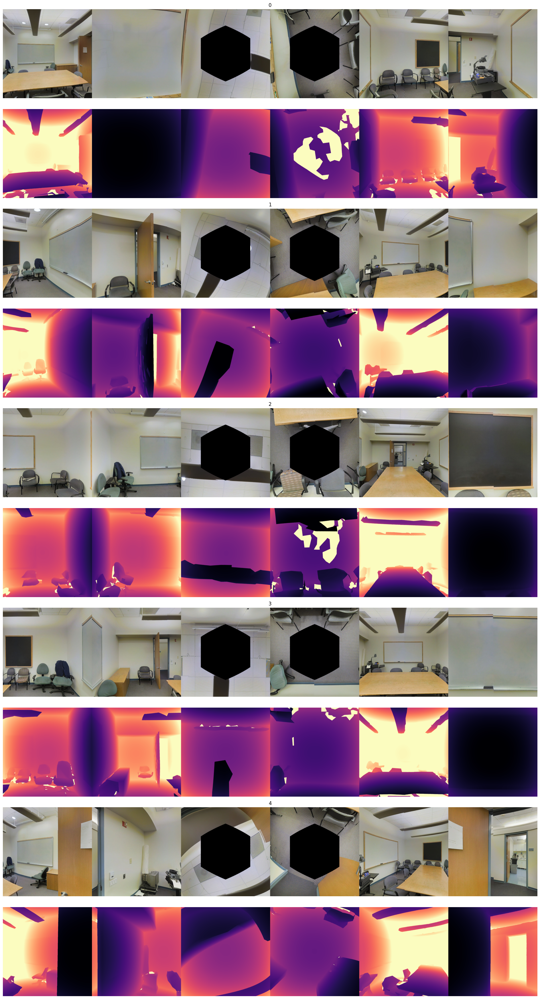

In [14]:
rgb = room_sample.rgba.to(device="cuda", dtype=th.float16)  # [S, 4, H, W], float16
depth = room_sample.depth.to(device="cuda", dtype=th.float16)  # [S, 1, H, W], float16

S = int(rgb.shape[0])
H = int(rgb.shape[2])
W = int(rgb.shape[3])


proj = OTCProjectorFast(face_size=1024, device=rgb.device, dtype=rgb.dtype)
faces_rgb, faces_a, depth = proj(rgb, depth)  # [B,6,3,F,F], [B,6,1,F,F]
faces_a = (faces_a > 0.5).float()
faces_rgba = th.cat([faces_rgb, faces_a], dim=2)        # [B,6,4,F,F]

# optional packed layout (row)
rgb = pack_row(faces_rgba)
depth = pack_row(depth)



fig, axes = plt.subplots(2*S, 1, figsize=(36, 7*S), squeeze=False)

for s in range(S):
    # RGBA for display (scale to [0,1])
    rgba = (rgb[s].permute(1, 2, 0).cpu().numpy())
    axes[2*s, 0].imshow(rgba)
    axes[2*s, 0].set_title(f"{s}")
    axes[2*s, 0].axis("off")

    d = depth[s, 0].cpu().numpy()
    alpha = rgba[..., 3]
    valid = (d > 0) & (alpha > 0)
    vmin, vmax = np.percentile(d[valid], [1, 90])
    axes[2*s+1, 0].imshow(d, cmap="magma", vmin=vmin, vmax=vmax, alpha=valid.astype(np.float32))
    axes[2*s+1, 0].axis("off")

plt.tight_layout()
plt.show()

